# Names: Lara Mechling, Corrina Hanson, Isaac Liem
## Date: 10/15/2022
## Course: DSC 450

# Title: Predicting Patients Diabetes Status

### Isaac Liem - Data Wrangler

In [16]:
# import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pandas_profiling

diabetes = pd.read_csv('diabetes.csv')

In [17]:
#Show sample of dataset
diabetes.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [18]:
# Check data types and for non-null fields
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [19]:
# numerical features histograms

'''
Hands On Predictive Analytics with Python
Alvaro Fuentes
'''
def desc_num_feature(feature_name, bins= 30, edgecolor= 'k', **kwargs):
    fig, ax= plt.subplots(figsize= (8, 4))
    diabetes[feature_name].hist(bins= bins, edgecolor= edgecolor, ax= ax, **kwargs)
    ax.set_title(feature_name, size= 15)
    plt.figtext(1, 0.15, str(diabetes[feature_name].describe().round(2)), size= 17)

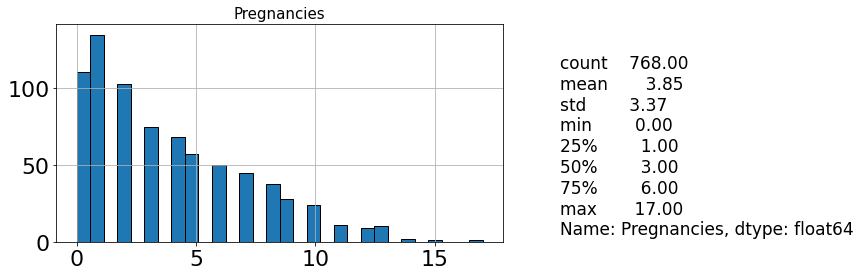

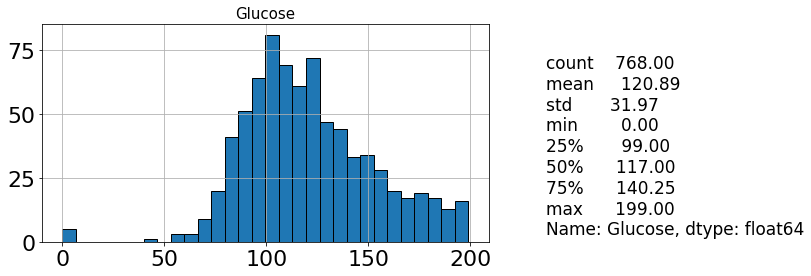

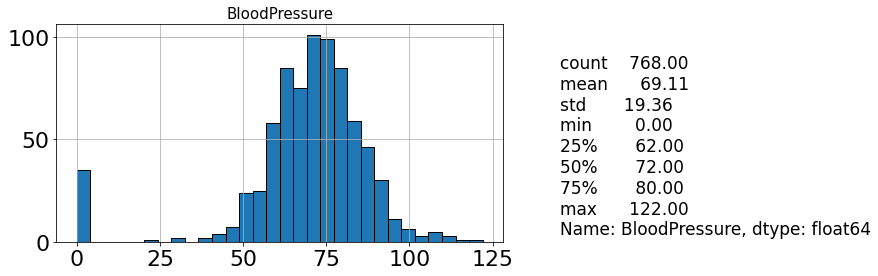

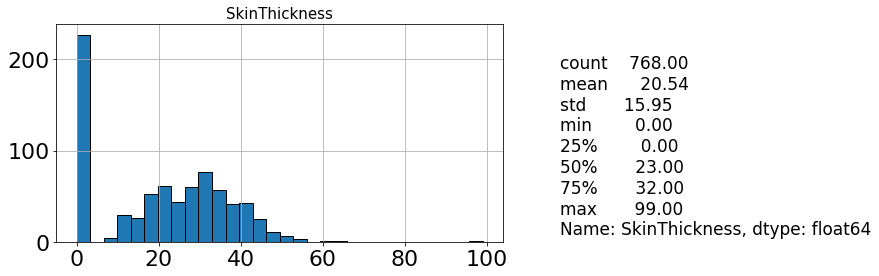

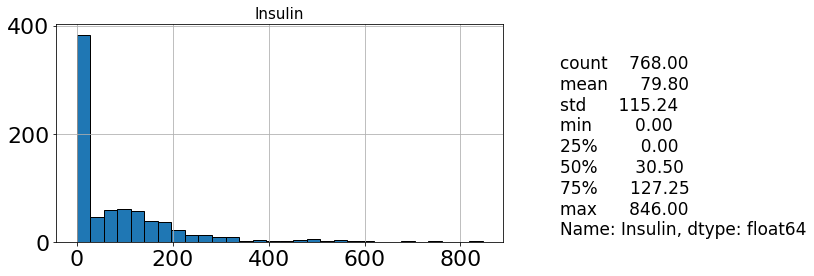

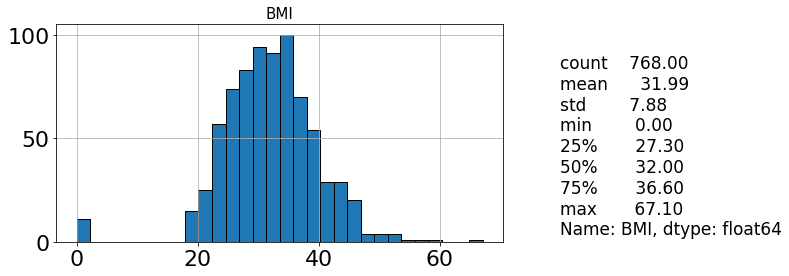

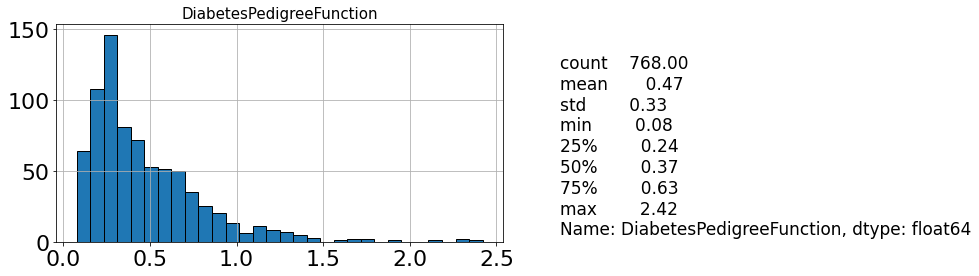

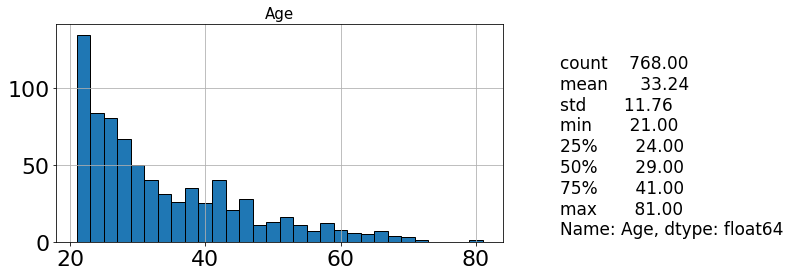

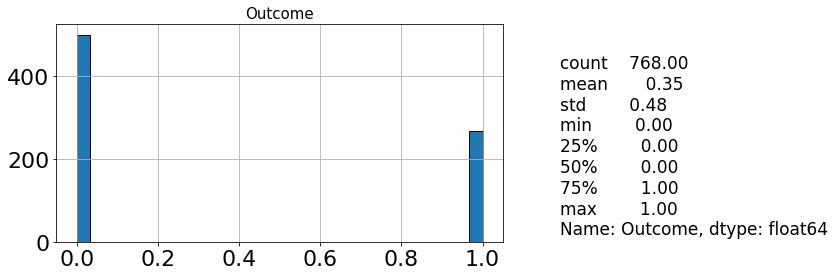

In [20]:
# view distributions of numerical features
for column in diabetes.columns:
    desc_num_feature(column)

In [6]:
# Show pandas profiling report
pandas_profiling.ProfileReport(diabetes)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [21]:
from sklearn.preprocessing import MinMaxScaler

# get column names of the features
diabetes_feat = diabetes.drop(['Outcome'], axis=1)
diabetes_feat = diabetes_feat.columns.tolist()

# initialize scaler and scale the feature columns
scaler = MinMaxScaler()
diabetes.loc[:, diabetes_feat] = scaler.fit_transform(diabetes[diabetes_feat])
diabetes.head(5)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.352941,0.743719,0.590164,0.353535,0.000000,0.500745,0.234415,0.483333,1
1,0.058824,0.427136,0.540984,0.292929,0.000000,0.396423,0.116567,0.166667,0
2,0.470588,0.919598,0.524590,0.000000,0.000000,0.347243,0.253629,0.183333,1
3,0.058824,0.447236,0.540984,0.232323,0.111111,0.418778,0.038002,0.000000,0
4,0.000000,0.688442,0.327869,0.353535,0.198582,0.642325,0.943638,0.200000,1


In [22]:
# show metrics of the data after scaling
diabetes.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,0.226180,0.607510,0.566438,0.207439,0.094326,0.476790,0.168179,0.204015,0.348958
std,0.198210,0.160666,0.158654,0.161134,0.136222,0.117499,0.141473,0.196004,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.058824,0.497487,0.508197,0.000000,0.000000,0.406855,0.070773,0.050000,0.000000
50%,0.176471,0.587940,0.590164,0.232323,0.036052,0.476900,0.125747,0.133333,0.000000
75%,0.352941,0.704774,0.655738,0.323232,0.150414,0.545455,0.234095,0.333333,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Corrina Hanson - Data Modeler

In [35]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics

# create dependent and independent variables
X = diabetes[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']]
y = diabetes['Outcome']

# split into training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [36]:
# create classifier
clf = RandomForestClassifier(n_estimators = 50)

# train model
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

In [37]:
# check model accuracy (this will change each time you run it but it seems to be steadily between 70 and 75)
print('Accuracy:', metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.7965367965367965


In [26]:
# find important features

# create classifier
clf = RandomForestClassifier(n_estimators = 50)

# train model
clf.fit(X_train, y_train)

importances = clf.feature_importances_
importances

array([0.10037625, 0.22242492, 0.09457512, 0.06775643, 0.0812044 ,
       0.17614859, 0.12183811, 0.13567618])

In [27]:
# source for this bit of code: https://vitalflux.com/feature-importance-random-forest-classifier-python/

sorted_indices = np.argsort(importances)[::-1]

feat_labels = diabetes.columns[1:]

for f in range(X_train.shape[1]):
    print("%2d) %-*s %f" % (f + 1, 30, feat_labels[sorted_indices[f]], importances[sorted_indices[f]]))

 1) BloodPressure                  0.222425
 2) DiabetesPedigreeFunction       0.176149
 3) Outcome                        0.135676
 4) Age                            0.121838
 5) Glucose                        0.100376
 6) SkinThickness                  0.094575
 7) BMI                            0.081204
 8) Insulin                        0.067756


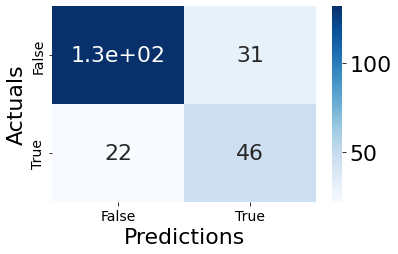

In [29]:
from sklearn import metrics
import seaborn as sns

confusion_matrix = metrics.confusion_matrix(y_test, y_pred)
sns.heatmap(confusion_matrix, annot=True, cmap='Blues', xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.rcParams.update({'font.size': 22})
plt.yticks(fontsize=14)
plt.ylabel('Actuals', fontsize=22)
plt.xticks(fontsize=14)
plt.xlabel('Predictions', fontsize=22)
plt.tight_layout()
plt.show()

In [38]:
print('Precision: %.3f' % metrics.precision_score(y_test, y_pred))
print('Recall: %.3f' % metrics.recall_score(y_test, y_pred))
print('Accuracy: %.3f' % metrics.accuracy_score(y_test, y_pred))
print('F1 Score: %.3f' % metrics.f1_score(y_test, y_pred))

Precision: 0.714
Recall: 0.723
Accuracy: 0.797
F1 Score: 0.719


## Lara Mechling - Visualizations and Presentations

In [65]:
import seaborn as sns
from matplotlib import rcParams

%matplotlib inline

In [75]:
sns.set_theme(style= 'white', palette= 'bright')
sns.set(rc = {'figure.figsize':(20,15)})

In [84]:
# kde of variables based on whether the patient has diabetes

'''
Seaborn
https://seaborn.pydata.org/tutorial/distributions.html
'''

def kde(dataset, x):
    kde= sns.displot(dataset, 
                           x= x, 
                           hue= 'Outcome', 
                           kind= 'kde', 
                           fill= True).set(title= x)
    return kde

C:\Users\laram\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


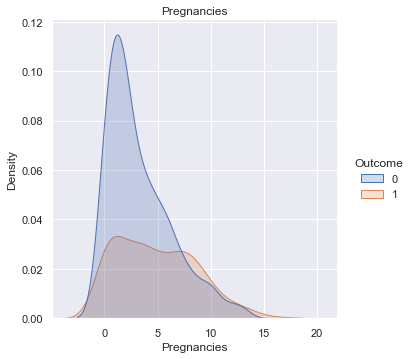

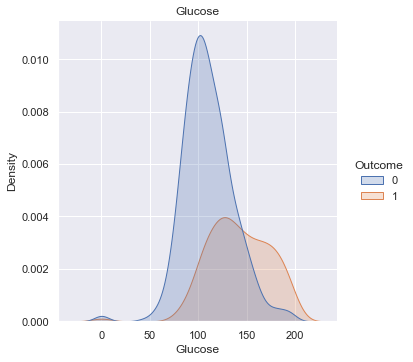

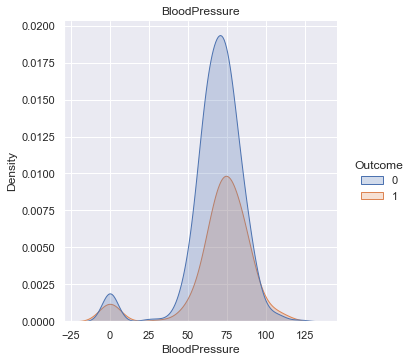

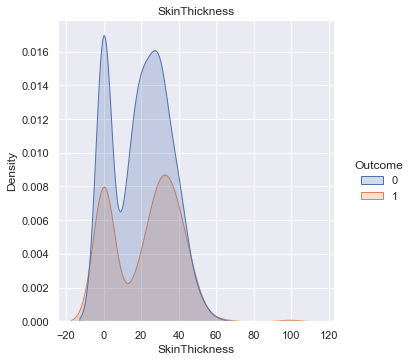

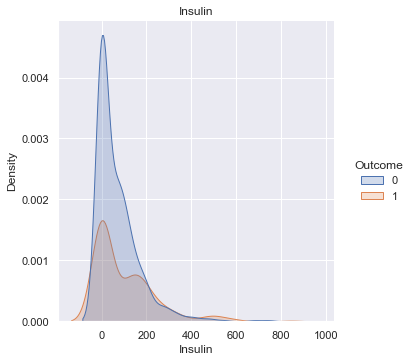

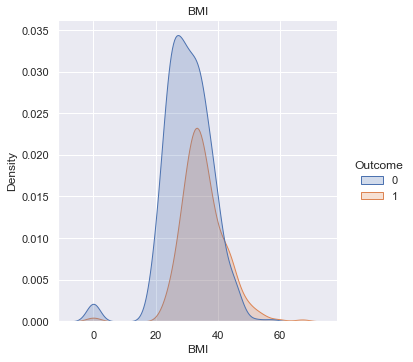

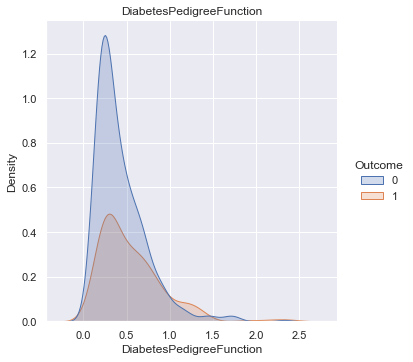

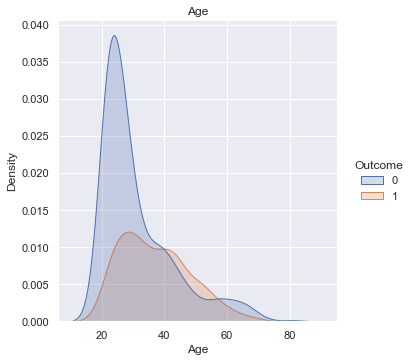

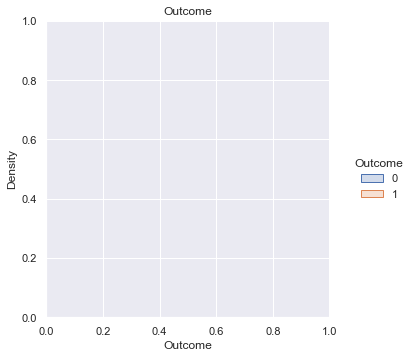

In [85]:
for column in diabetes:
    axs[i]= kde(diabetes, column)

In [94]:
# seaborn category plat based on pregnancies

'''
Seaborn
https://seaborn.pydata.org/tutorial/categorical.html
'''
def category(dataset, y, x= 'Pregnancies', hue= 'Outcome', kind = 'box'):
    plt.figure(figsize=(16, 6))
    cat= sns.catplot(data= diabetes, x= x, y= y, hue= hue, kind= kind)
    return cat

<Figure size 1152x432 with 0 Axes>

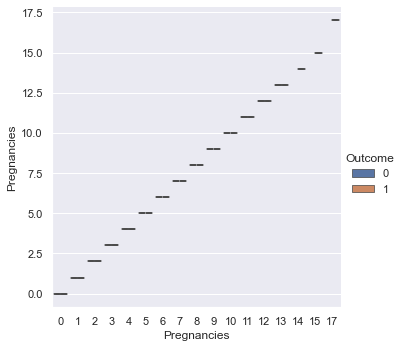

<Figure size 1152x432 with 0 Axes>

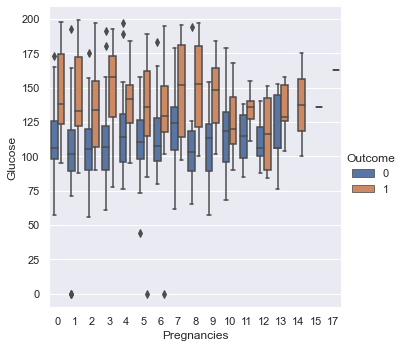

<Figure size 1152x432 with 0 Axes>

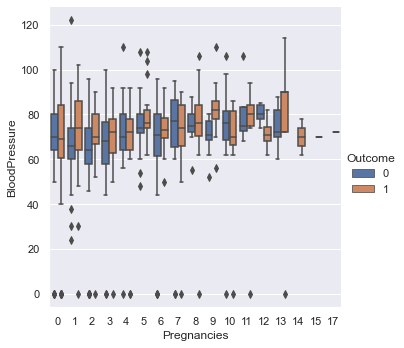

<Figure size 1152x432 with 0 Axes>

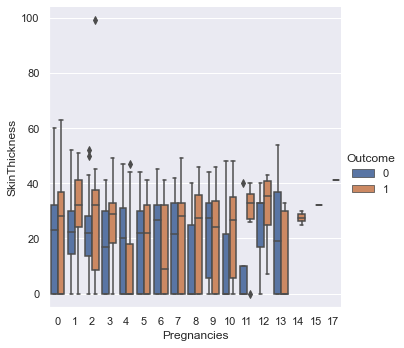

<Figure size 1152x432 with 0 Axes>

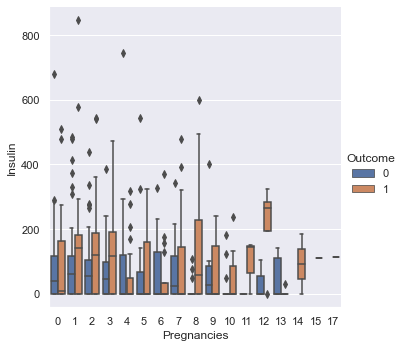

<Figure size 1152x432 with 0 Axes>

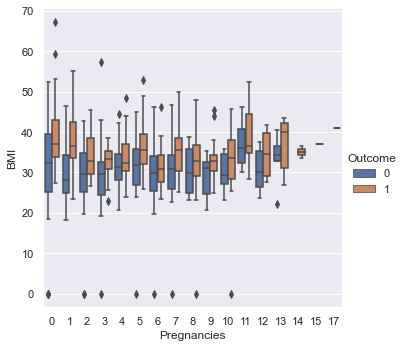

<Figure size 1152x432 with 0 Axes>

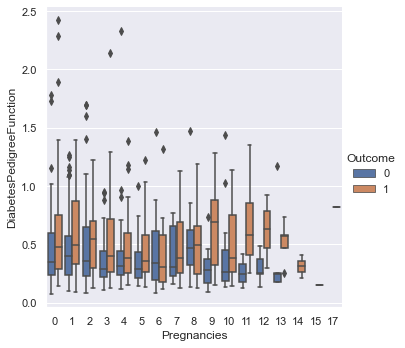

<Figure size 1152x432 with 0 Axes>

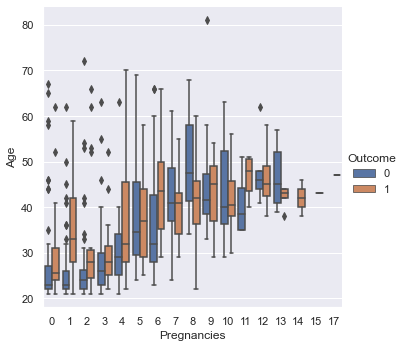

<Figure size 1152x432 with 0 Axes>

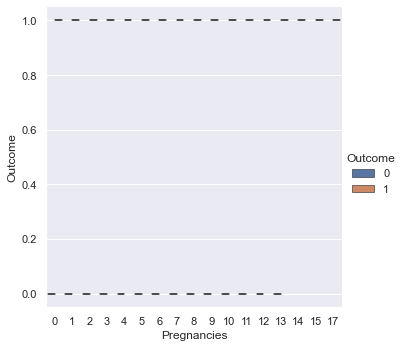

In [95]:
for column in diabetes:
    category(diabetes, column)

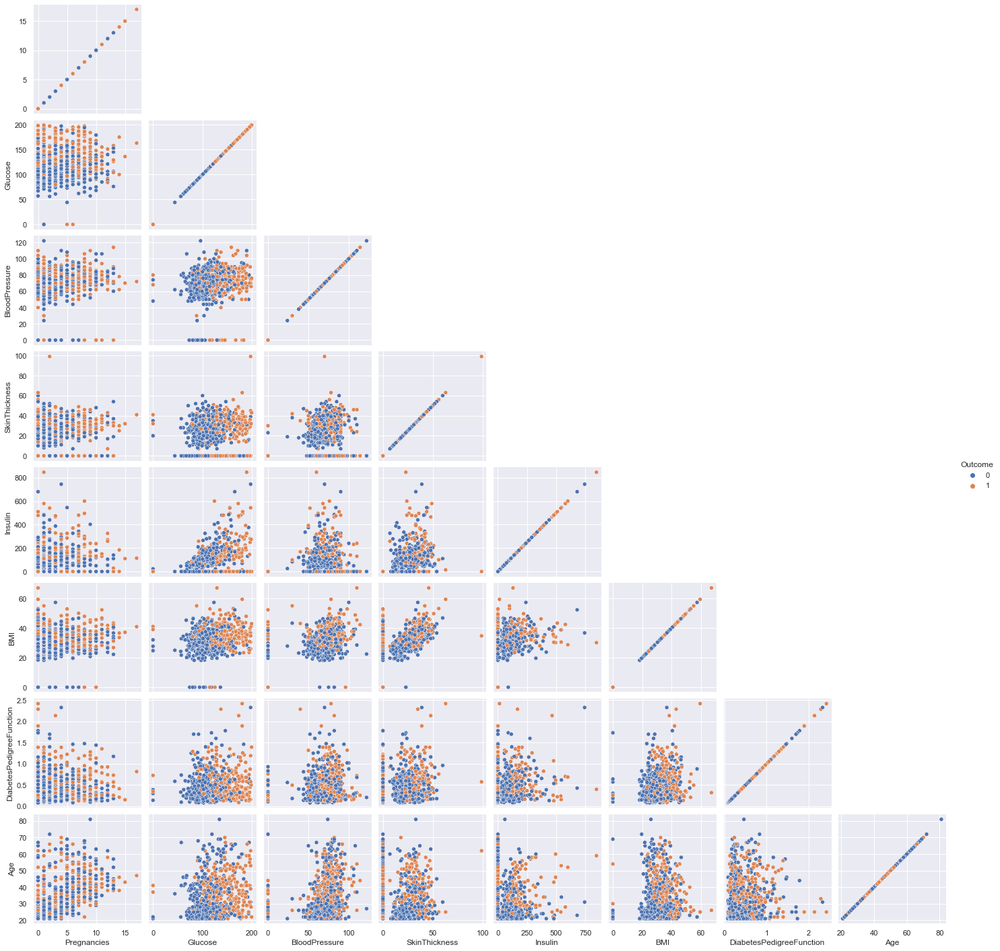

In [88]:
# seaborn matrix plot
matrix= sns.pairplot(diabetes, hue="Outcome", corner= True, diag_kind= None)

Text(0.5, 1.0, 'Correlation Heatmap')

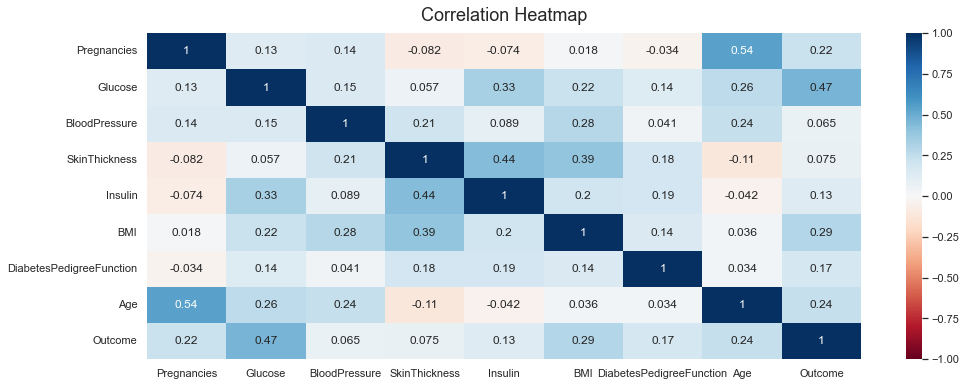

In [91]:
## heatmap

plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(diabetes.corr(), vmin=-1, vmax=1, annot=True, cmap='RdBu')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12)